In [113]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.cm as cm
import matplotlib.patches as mpatches
from matplotlib.ticker import MultipleLocator
from scipy.stats import linregress
import matplotlib.colors as mcolors
import fiona
import geopandas as gpd
import rasterio
from osgeo import gdal
import rasterio.features
import rasterio.warp
from rasterio.plot import show
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib as mpl
from matplotlib.colors import ListedColormap

### FIG 01

In [78]:
med=gpd.read_file("Medellin_Risk_V2.gdb", driver='FileGDB', layer='Med_1770_2023_No_StoDomingo')

In [79]:
reference=gpd.read_file("Medellin_Risk_V2.gdb", driver='FileGDB', layer='Point_of_reference')

In [80]:
rivers=gpd.read_file("Medellin_Risk_V2.gdb", driver='FileGDB', layer='Water_network')

In [81]:
landslides_VdeA=gpd.read_file("Medellin_Risk_V2.gdb", driver='FileGDB', layer='Landslides_VdeA_filtered')

In [61]:
landslides_VdeA

,Name,Year,Fatalities,geometry
0,Villatina - 1987,1987,500 fatalities,POINT Z (4719557.072 2248452.962 0.000)
1,Alto Verde - 2008,2008,12 fatalities,POINT Z (4717919.682 2244137.819 0.000)
2,Santo Domingo Savio - 1974,1974,> 70 fatalities,POINT Z (4718600.635 2254516.039 0.000)
3,Aguas Frías - 1772,1772,no fatalities,POINT Z (4710991.636 2247656.825 0.000)
4,La Iguaná - 1880,1880,7 fatalities,POINT Z (4713207.910 2251518.493 0.000)
5,Santa Elena - 1954,1954,> 100 fatalities,POINT Z (4721767.015 2247852.847 0.000)


In [62]:
landslides_VdeA_filtered=landslides_VdeA[landslides_VdeA['Year']=='1987']

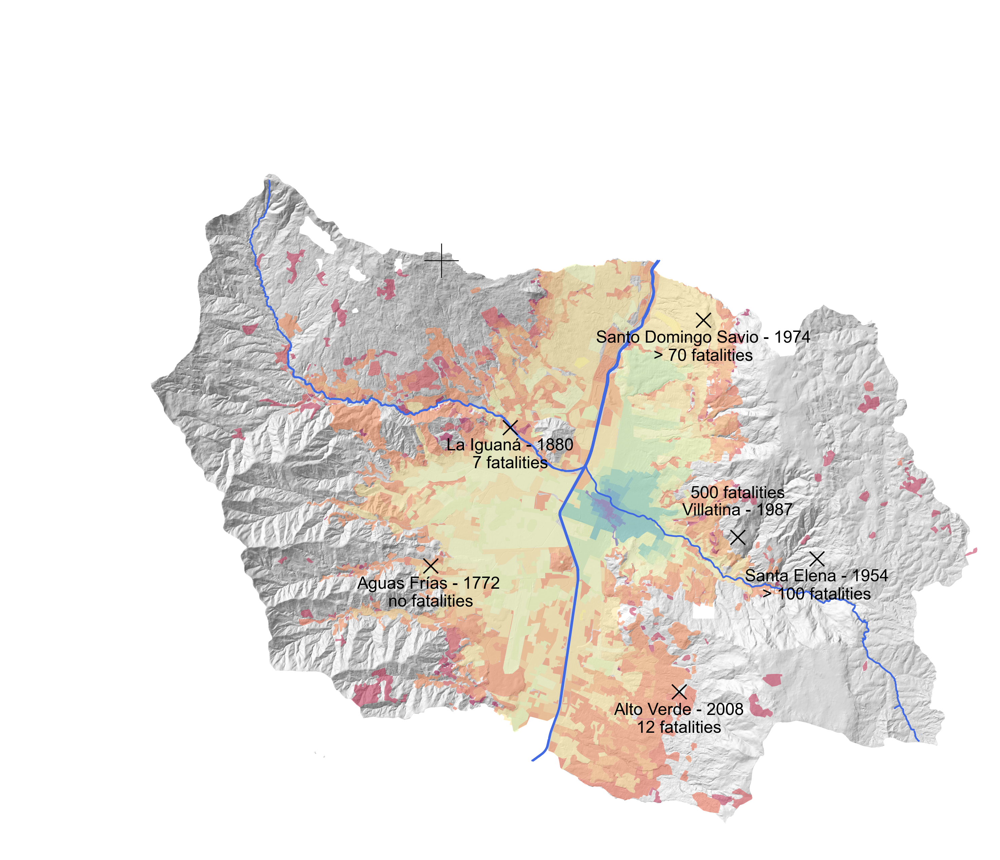

In [74]:
## FIGURE 1

hillshade_path = 'Med_hillshade_complete_v3.tif'

# Open the hillshade raster file
with rasterio.open(hillshade_path) as src:
    # Read the data
    hillshade = src.read(1)

hillshade_masked = np.where(hillshade == 0, np.nan, hillshade)

fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
    

med.year = med.year.astype(str)
med.plot(ax=ax,
         column='year', 
         cmap='Spectral_r',
         alpha=0.5,
         #legend=True,
         #legend_kwds={"loc":"best", "title":"Year", 
          #            "bbox_to_anchor":(1.1, 1), "fontsize":5, 
           #           "markerscale":0.5, "frameon":False},
         zorder=2)

#landslides.plot(ax=ax,
 #               markersize=0.2,
  #              color='k',
   #             zorder=6)

rivers.plot(ax=ax,
            color='royalblue',
            linewidth=1.2,
            zorder=3)

landslides_VdeA=landslides_VdeA[landslides_VdeA['Year']!='1987']
landslides_VdeA_filtered.plot(ax=ax,
                     markersize=110,
                     marker='x',
                     color='k',
                     linewidth=1,
                     zorder=4,
                     )
landslides_VdeA.plot(ax=ax,
                     markersize=110,
                     marker='x',
                     color='k',
                     linewidth=1,
                     zorder=4,
                     )
reference.plot(ax=ax, markersize=600,color='k',marker='+',linewidth=0.6,zorder=5)

extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
ax.imshow(hillshade, cmap='gray', extent=extent, zorder=1, alpha=0.6)

for x, y, label in zip(landslides_VdeA.geometry.x, landslides_VdeA.geometry.y, landslides_VdeA['Name']):
    ax.annotate(label, (x, y), textcoords="offset points", xytext=(0,-16), ha='center', fontsize=12, fontname="Arial", color='k')

for x, y, label in zip(landslides_VdeA.geometry.x, landslides_VdeA.geometry.y, landslides_VdeA['Fatalities']):
    ax.annotate(label, (x, y), textcoords="offset points", xytext=(0,-29), ha='center', fontsize=12, fontname="Arial", color='k')

for x, y, label in zip(landslides_VdeA_filtered.geometry.x, landslides_VdeA_filtered.geometry.y, landslides_VdeA_filtered['Name']):
    ax.annotate(label, (x, y), textcoords="offset points", xytext=(0,16), ha='center', fontsize=12, fontname="Arial", color='k')

for x, y, label in zip(landslides_VdeA_filtered.geometry.x, landslides_VdeA_filtered.geometry.y, landslides_VdeA_filtered['Fatalities']):
    ax.annotate(label, (x, y), textcoords="offset points", xytext=(0,28), ha='center', fontsize=12, fontname="Arial", color='k')
    
ax.set_axis_off()
plt.tight_layout()
plt.savefig("fig01a_FV.pdf", dpi=300, bbox_inches='tight')
plt.show()

### FIG 03

In [75]:
med_GEP=gpd.read_file("Medellin_Risk_V2.gdb", driver='FileGDB', layer='Original_GEP_2005_2023')

In [82]:
landslides=gpd.read_file("Medellin_Risk_V2.gdb", driver='FileGDB', layer='Landslides_geohazards_FV')

C:\Users\Sara\anaconda3\envs\Med_risk_v2\lib\site-packages\geopandas\io\file.py:399: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  as_dt = pd.to_datetime(df[k], errors="ignore")


In [87]:
landslides_filtered=landslides[landslides['Year']>='2005']

In [90]:
landslides_filtered

,Fecha,Fallecidos,Year,geometry
0,2008-11-16 00:00:00+00:00,12.0,2008,POINT (4717888.538 2244169.961)
1,2007-10-23 00:00:00+00:00,2.0,2007,POINT (4709461.716 2249242.268)
2,2010-11-02 00:00:00+00:00,1.0,2010,POINT (4709413.983 2249923.901)
4,2006-11-14 00:00:00+00:00,5.0,2006,POINT (4709227.701 2249903.483)
14,2005-05-20 00:00:00+00:00,1.0,2005,POINT (4717462.603 2254880.682)
...,...,...,...,...
986,2021-06-10 00:00:00+00:00,1.0,2021,POINT (4717944.980 2249186.366)
1001,2022-06-10 00:00:00+00:00,0.0,2022,POINT (4719168.569 2249113.418)
1027,2018-05-09 00:00:00+00:00,0.0,2018,POINT (4719286.284 2249790.547)
1031,2022-06-27 00:00:00+00:00,0.0,2022,POINT (4717310.397 2250568.638)


In [76]:
med_GEP_2005 = med_GEP.query('SymbolID == 2005')

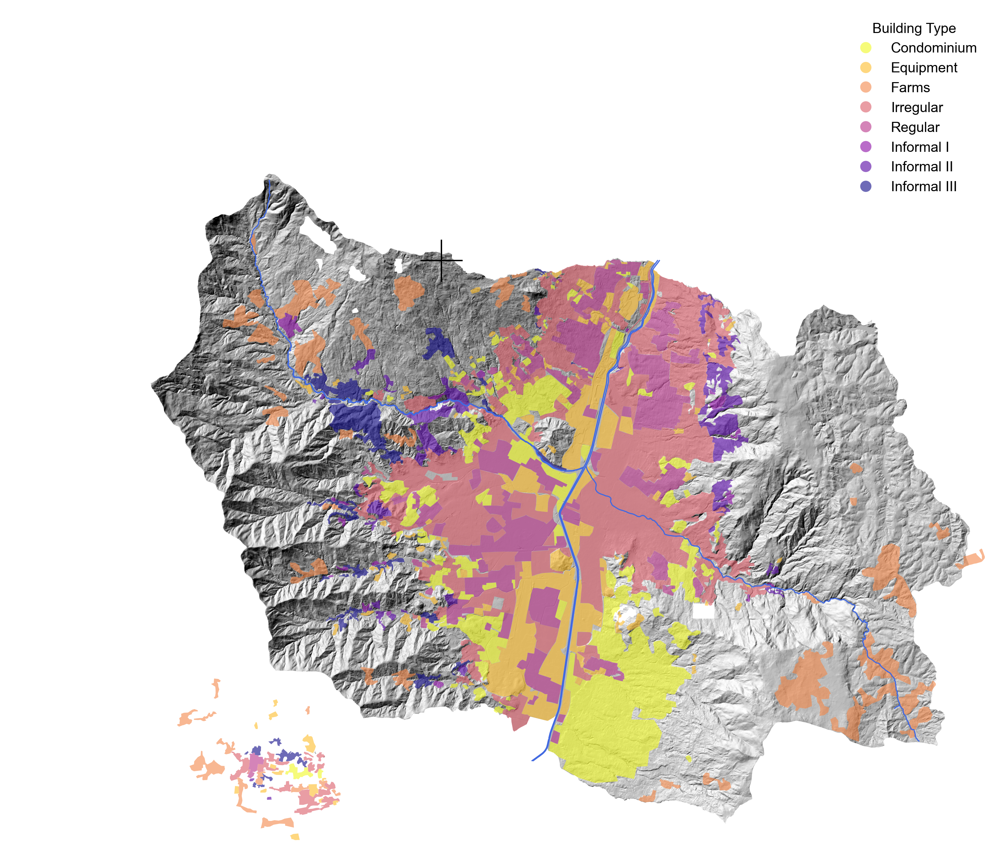

In [128]:
#### GROWTH FIGURE 2005
building_labels = ['Condominium', 'Equipment', 'Farms', 'Irregular', 'Regular', 'Informal I', 'Informal II', 'Informal III']
color_palette=[
    "#ffff00",  # Bright Yellow
    "#B4E370",  # lighter green
    "#33a02c",  # Bright Green
    "#E84C4C",  # Bright Red
    "#ff7f00",  # Bright Orange
    "#42E1D2",  # Bright Blue
    "#0000ff",  # Bright Deep Blue
    "#6a3d9a"]  # Bright Purple
custom_cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", color_palette)

#HILLSHADE
hillshade_path = 'Med_hillshade_complete_v3.tif'
with rasterio.open(hillshade_path) as src:
    # Read the data
    hillshade = src.read(1)
hillshade_masked = np.where(hillshade == 0, np.nan, hillshade)


#PLOT 
fig, ax = plt.subplots(figsize=(10, 10),dpi=300)
    
med_GEP_2005.plot(ax=ax,
         column='Name', 
         cmap='plasma_r',
         alpha= 0.6,
         legend=True,
         legend_kwds={"loc":"best", "title":"Building Type",  "labels":building_labels,
                       "fontsize":10, 
                      "markerscale":0.8, "frameon":False},
         zorder=2)
rivers.plot(ax=ax,
            color='royalblue',
            linewidth=0.8,
            zorder=3)
reference.plot(ax=ax,
               markersize=900,
               color='k',
               marker='+',
               linewidth=1,
               zorder=5)

#landslides_filtered.plot(ax=ax,
#                markersize=20,
#                marker='o',
#                color='k',
#                linewidth=1,
#                zorder=4,
#                )

extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
ax.imshow(hillshade, cmap='gray', extent=extent, zorder=1)

    
ax.set_axis_off()
plt.tight_layout()
plt.savefig("FigA19_FV.pdf", dpi=300)
plt.show()

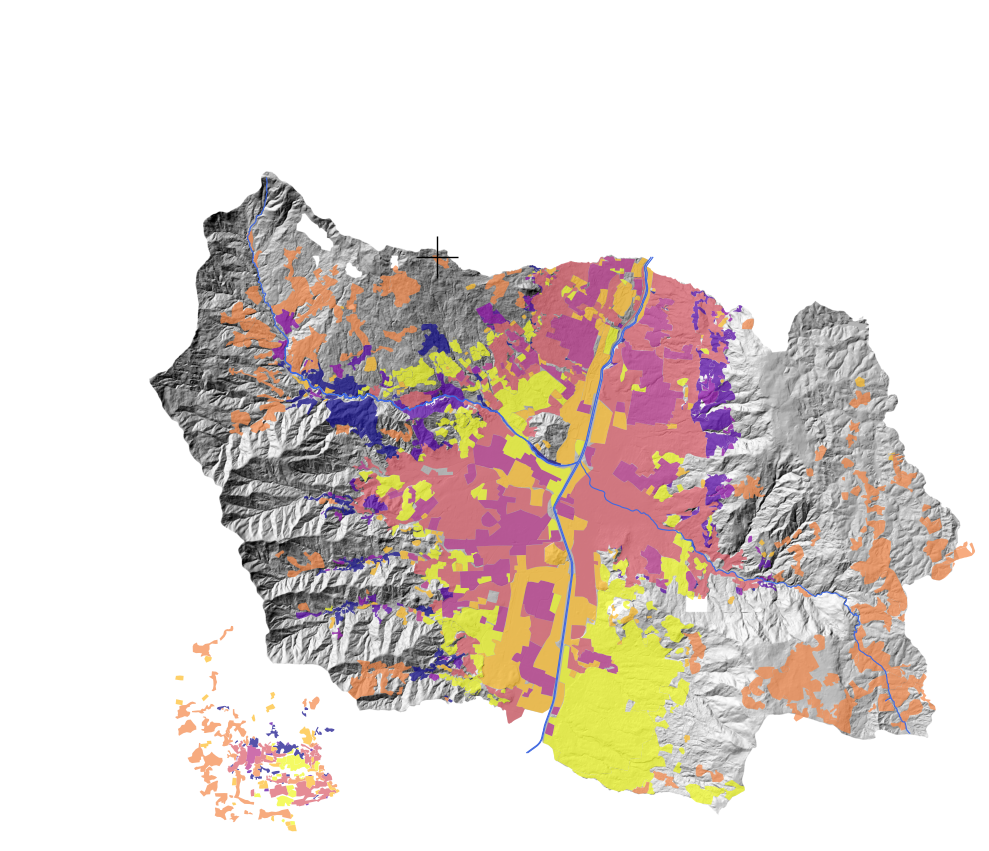

In [129]:
#### GROWTH FIGURE 2023
building_labels = ['Condominium', 'Equipment', 'Farms', 'Irregular', 'Regular', 'Informal I', 'Informal II', 'Informal III']

#original_cmap = plt.cm.get_cmap('Set3_r')
#excluded_indices = [1, 3, 9]  # Indices of grayish colors in Set3
#selected_colors = [original_cmap(i) for i in range(original_cmap.N) if i not in excluded_indices]
#custom_cmap = ListedColormap(selected_colors[:8]) 

#custom_palette = ["#1b9e77","#d95f02","#7570b3","#e7298a","#66a61e","#e6ab02","#a6761d","#666666"]
#custom_palette = ["#e41a1c","#377eb8","#4daf4a","#984ea3","#ff7f00","#ffff33","#a65628","#f781bf"]
#custom_palette = ['#66c2a5','#fc8d62','#8da0cb','#e78ac3','#a6d854','#ffd92f','#e5c494','#b3b3b3']
#custom_palette = ['#7fc97f','#beaed4','#fdc086','#ffff99','#386cb0','#f0027f','#bf5b17','#666666']

custom_cmap = ListedColormap(custom_palette)

#HILLSHADE
hillshade_path = 'Med_hillshade_complete_v3.tif'
with rasterio.open(hillshade_path) as src:
    # Read the data
    hillshade = src.read(1)
hillshade_masked = np.where(hillshade == 0, np.nan, hillshade)


#PLOT 
fig, ax = plt.subplots(figsize=(10, 10))#,dpi=300)
    
med_GEP.plot(ax=ax,
         column='Name', 
         cmap='plasma_r',
         alpha= 0.7,
         #legend=True,
         #legend_kwds={"loc":"best", "title":"Building Type",  "labels":building_labels,
                       #"fontsize":10, 
                      #"markerscale":0.8, "frameon":False},
         zorder=2)
rivers.plot(ax=ax,
            color='royalblue',
            linewidth=0.8,
            zorder=3)
reference.plot(ax=ax,
               markersize=900,
               color='k',
               marker='+',
               linewidth=1,
               zorder=5)
#landslides_filtered.plot(ax=ax,
#                markersize=15,
#                marker='o',
#                color='k',
#                linewidth=1,
#                zorder=4,
#                )

extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
ax.imshow(hillshade, cmap='gray', extent=extent, zorder=1)

ax.set_axis_off()
plt.tight_layout()
plt.savefig("FigA19b_FV.pdf", dpi=300, bbox_inches='tight')
plt.show()

### FIG 05

In [43]:
landslides_location=gpd.read_file("Medellin_Risk_V2.gdb", driver='FileGDB', layer='Landslides_no_center_FV')

C:\Users\Sara\anaconda3\envs\Med_risk_v2\lib\site-packages\geopandas\io\file.py:399: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  as_dt = pd.to_datetime(df[k], errors="ignore")


In [44]:
landslides_location['relative_distance']=landslides_location['dist_border']/(landslides_location['dist_center']+landslides_location['dist_border'])

In [45]:
landslides_location.Year=landslides_location.Year.astype(int)
bins = [0, 1770, 1800, 1847, 1889, 1908, 1913, 1931, 1940, 1956, 1958, 1976, 1979, 1991, 2005, 2010, 2015, 2020, 2023]
labels = ['<1770', '1771-1800', '1801-1847', '1848-1889', '1890-1908', '1909-1913', '1914-1931', '1932-1940', '1941-1956', '1957-1958', '1959-1976', '1977-1979', '1980-1991', '1992-2005', '2006-2010', '2011-2015', '2016-2020', '2021-2023']

# Create a new column with categorical values based on the periods
landslides_location['period'] = pd.cut(landslides_location['Year'], bins=bins, labels=labels, right=True)

In [46]:
landslides_location.head()

,Fecha,Fallecidos,Year,dist_center,dist_border,geometry,relative_distance,period
0,2008-11-16 00:00:00+00:00,12.0,2008,5160.455152,27.556049,POINT (4717888.538 2244169.961),0.005311,2006-2010
1,2007-10-23 00:00:00+00:00,2.0,2007,6734.968229,295.279818,POINT (4709461.716 2249242.268),0.042001,2006-2010
2,2010-11-02 00:00:00+00:00,1.0,2010,6836.623528,4.348262,POINT (4709413.983 2249923.901),0.000636,2006-2010
3,1990-10-13 00:00:00+00:00,4.0,1990,7018.869236,14.255961,POINT (4709227.701 2249903.483),0.002027,1980-1991
4,2006-11-14 00:00:00+00:00,5.0,2006,7018.869236,14.255961,POINT (4709227.701 2249903.483),0.002027,2006-2010


In [47]:
landslides_location['period'].value_counts()

period
1992-2005    576
1980-1991    237
2006-2010     53
2016-2020     39
1959-1976     37
2011-2015     27
2021-2023     16
1977-1979     10
1941-1956      6
1957-1958      1
1914-1931      1
1771-1800      0
1932-1940      0
1909-1913      0
1890-1908      0
1848-1889      0
1801-1847      0
<1770          0
Name: count, dtype: int64

In [48]:
dt_area = pd.read_csv('DB_area.txt', delimiter=',')

In [49]:
years_per_period=[0]
years = [1770, 1800, 1847, 1889, 1908, 1913, 1931, 1940, 1956, 1958, 1976, 1979, 1991, 2005, 2010, 2015, 2020, 2023]
for i in range (0, 17):
    years_per_period.append(years[i+1]-years[i])

dt_area['n. years']=years_per_period
dt_area['growth_rate']=dt_area['area(km2)']/dt_area['n. years']
dt_area.growth_rate

0          inf
1     0.004872
2     0.007666
3     0.028986
4     0.104177
5     0.028402
6     0.277032
7     0.898684
8     0.711208
9     0.685639
10    1.453868
11    0.780020
12    0.858043
13    2.078439
14    0.867665
15    0.532793
16    0.333622
17    0.221110
Name: growth_rate, dtype: float64

In [50]:
filter_periods=['1992-2005', '1980-1991', '2016-2020', '2006-2010', '1957-1958', '2021-2023', '1959-1976', '2011-2015', '1941-1956', '1914-1931', '1977-1979']
dt_area_filtered=dt_area[dt_area['period'].isin(filter_periods)]
dt_area_filtered

,year,period,area(km2),cumulative_area,n. years,growth_rate
6,1931,1914-1931,4.986584,9.011014,18,0.277032
8,1956,1941-1956,11.379334,28.478504,16,0.711208
9,1958,1957-1958,1.371279,29.849783,2,0.685639
10,1976,1959-1976,26.169622,56.019405,18,1.453868
11,1979,1977-1979,2.340059,58.359464,3,0.780020
12,1991,1980-1991,10.296515,68.655979,12,0.858043
13,2005,1992-2005,29.098145,97.754124,14,2.078439
14,2010,2006-2010,4.338324,102.092448,5,0.867665
15,2015,2011-2015,2.663966,104.756414,5,0.532793
16,2020,2016-2020,1.668110,106.424524,5,0.333622


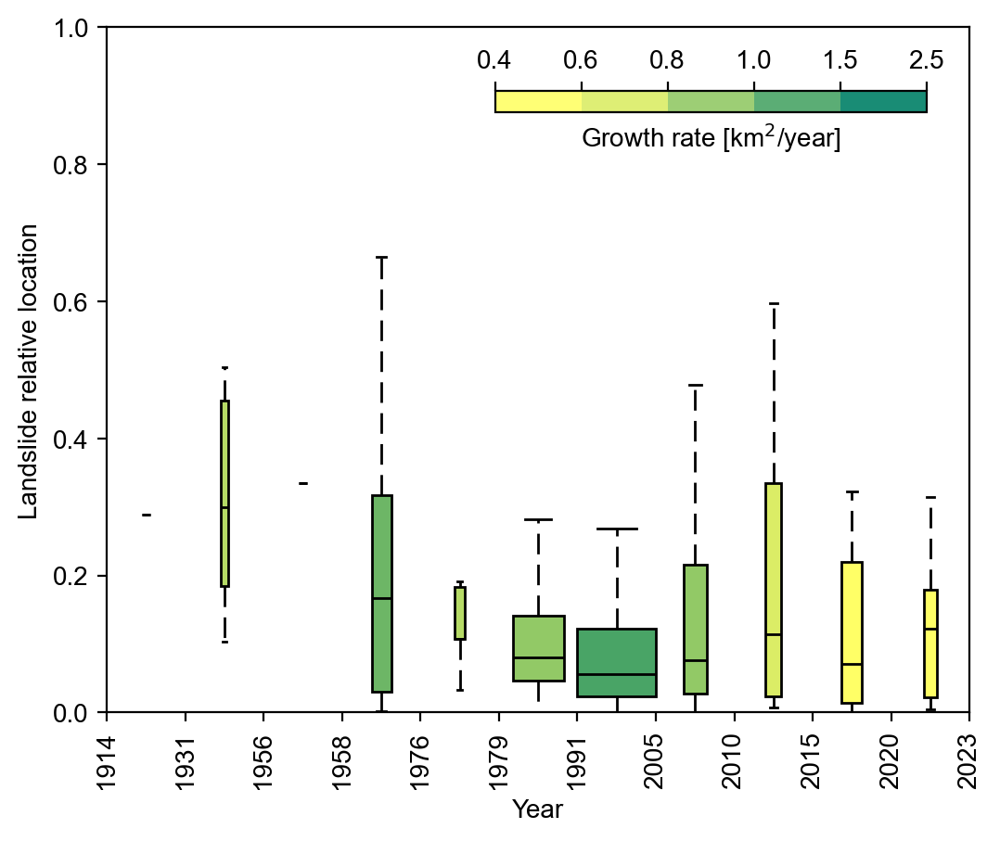

In [69]:
## Landslide relative distance
mpl.rcParams['font.family'] = 'Arial'

area_palette = cm.summer_r(np.linspace(0, 1, 8))

fig, ax = plt.subplots(figsize=(6, 6), dpi=200)


# Prepare data for plotting
plot_data = []
labels = dt_area_filtered['growth_rate'].tolist()
for period in dt_area_filtered['period'].unique():
    a = landslides_location[landslides_location['period'] == period]['relative_distance']
    plot_data.append(a)
    labels.append(dt_area_filtered[dt_area_filtered['period']==period]['growth_rate'])

# Create the boxplot
boxplot = ax.boxplot(plot_data, patch_artist=True, widths=[0.1, 0.1, 0.1, 0.25, 0.13, 0.65, 1, 0.3, 0.2, 0.26, 0.17])

# Assign colors to each box corresponding to the area range
for i, patch in enumerate(boxplot['boxes']):
    if labels[i]<=0.4:
        patch.set_facecolor(area_palette[0])
    elif labels[i]>0.4 and labels[i]<=0.6:
        patch.set_facecolor(area_palette[1])
    elif labels[i]>0.6 and labels[i]<=0.8:
        patch.set_facecolor(area_palette[2])
    elif labels[i]>0.8 and labels[i]<=1:
        patch.set_facecolor(area_palette[3])
    elif labels[i]>1 and labels[i]<=1.5:
        patch.set_facecolor(area_palette[4])
    else:
        patch.set_facecolor(area_palette[5])

        
#COLORBAR
colorbar_intervals = [0.4, 0.6, 0.8, 1, 1.5, 2.5]
boundaries= [0.4, 0.6, 0.8, 1, 1.5, 2.5]
cmap = mcolors.ListedColormap(area_palette, name='from_list', N=len(area_palette))
norm = mcolors.BoundaryNorm(colorbar_intervals, cmap.N, clip=True)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation='horizontal', 
                    boundaries=boundaries, 
                    ticks=boundaries, 
                    location='top', 
                    shrink=0.5, 
                    anchor=(0.90,-1.2), 
                    aspect = 20,
                    alpha=0.9)
cbar.ax.tick_params(axis='both', labelsize=10)
cbar.set_label('Growth rate [km$^2$/year]', labelpad=-38, size=10)


# Set the labels and title
years = [1914, 1931, 1956, 1958, 1976, 1979, 1991, 2005, 2010, 2015, 2020, 2023]
plt.xticks(np.arange(0.5,12.5), years, rotation=90)
plt.yticks(np.arange(0, 1.1, 0.2))
plt.ylim(0, 1)
plt.xlabel('Year')
plt.ylabel('Landslide relative location')


for flier in boxplot['fliers']:
    flier.set_markersize(0) 

for median in boxplot['medians']:
    median.set_color('k')
    
for whisker in boxplot['whiskers']:
    whisker.set_linestyle('--')
    whisker.set_dashes((8, 4))

plt.savefig("Fig05_FV.pdf", dpi=300, bbox_inches='tight')
plt.show()


In [21]:
counts = landslides_location['period'].value_counts()
counts

period
1992-2005    511
1980-1991    209
2016-2020     36
2006-2010     21
2021-2023     16
1959-1976     16
2011-2015      5
1941-1956      5
1977-1979      4
<1770          0
1771-1800      0
1932-1940      0
1914-1931      0
1909-1913      0
1890-1908      0
1848-1889      0
1801-1847      0
1957-1958      0
Name: count, dtype: int64

#### ROSE DIAGRAM

In [70]:
city_center=gpd.read_file("Medellin_Risk_V2.gdb", driver='FileGDB', layer='City_center')
landslides=gpd.read_file("Medellin_Risk_V2.gdb", driver='FileGDB', layer='Landslides_no_center_FV')
city_center_x = city_center.geometry.x.iloc[0]
city_center_y = city_center.geometry.y.iloc[0]

C:\Users\Sara\anaconda3\envs\Med_risk_v2\lib\site-packages\geopandas\io\file.py:399: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  as_dt = pd.to_datetime(df[k], errors="ignore")


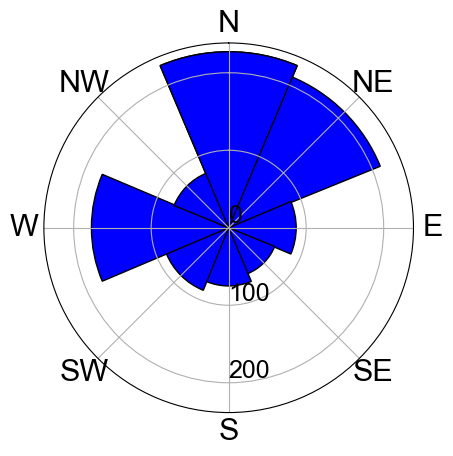

In [73]:
def calculate_direction(row, center_x, center_y):
    dx = row.geometry.x - center_x
    dy = row.geometry.y - center_y
    angle = np.arctan2(dy, dx)
    angle = np.degrees(angle)
    angle = (angle + 360) % 360  # Ensure angle is between 0 and 360
    angle = (450 - angle) % 360  # Adjust to make 0 degrees correspond to North
    return angle

# Calculate directions
landslides['direction'] = landslides.apply(lambda row: calculate_direction(row, center_x=city_center_x, center_y=city_center_y), axis=1)
#print(landslides[['geometry', 'direction']]) 

# Function to categorize direction
def categorize_direction(angle):
    if 337.5 <= angle or angle < 22.5:
        return 'North'
    elif 22.5 <= angle < 67.5:
        return 'North-East'
    elif 67.5 <= angle < 112.5:
        return 'East'
    elif 112.5 <= angle < 157.5:
        return 'South-East'
    elif 157.5 <= angle < 202.5:
        return 'South'
    elif 202.5 <= angle < 247.5:
        return 'South-West'
    elif 247.5 <= angle < 292.5:
        return 'West'
    elif 292.5 <= angle < 337.5:
        return 'North-West'

landslides['category'] = landslides['direction'].apply(categorize_direction)
#print(landslides[['direction', 'category']])  # Check categorized directions

# Count occurrences
direction_counts = landslides['category'].value_counts().reindex(
    ['North', 'North-East', 'East', 'South-East', 'South', 'South-West', 'West', 'North-West'],
    fill_value=0
)

# Create the rose diagram
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
categories = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False).tolist()
angles += angles[:1]  # repeat the first value to close the circle

values = direction_counts.values.tolist()
values += values[:1]  # repeat the first value to close the circle

bars = ax.bar(angles, values, width=0.8, bottom=0.1, color='blue', edgecolor='black')

ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)
ax.set_rlabel_position(180) 
max_value = 200 #max(values)
step = max_value // 2 if max_value > 2 else 1
ax.set_yticks(np.arange(0, max_value + step, step))
ax.tick_params(axis='y', labelsize=18)
ax.tick_params(axis='x', labelsize=22)

plt.savefig("landslide_direction.pdf", dpi=300, bbox_inches='tight')
plt.show()

In [74]:
direction_counts

category
North         227
North-East    211
East           87
South-East     64
South          75
South-West     87
West          177
North-West     76
Name: count, dtype: int64

In [40]:
landslides

,FID,OBJECTID,bd,id,Tipo,Fecha,Detonante,DetonanDes,Fuente,Subregion,...,Economicas,Notas,dist_center,angle_center,dist_border,NEAR_FID,year,geometry,direction,category
0,61,63,ant,6471,Landslide,1998-05-31 00:00:00+00:00,Rainfall,Desconocida - Infiltración de aguas lluvias,Cuerpo de Bomberos de Itaguí,Valle de Aburrá,...,0.0,(di6author : rsb)(di6date : 04/06/01),871.999445,-108.193604,1301.839722,7,1998,POINT (4716466.034 2249872.591),18.193604,North
1,63,65,ant,7429,Landslide,2001-01-21 00:00:00+00:00,Erosion,Otra causa - Socavación de la quebrada,Bomberos Itagüí,Valle de Aburrá,...,0.0,(di6author : jdc)(di6date : 2003/06/27),1151.041411,-15.348675,2699.150386,7,2001,POINT (4715083.784 2249348.857),285.348675,West
2,146,149,ant,7526,Landslide,2002-10-24 00:00:00+00:00,Unknown,Desconocida - No reportada,Bomberos Envigado,Valle de Aburrá,...,0.0,(di6author : jdc)(di6date : 2003/06/27),656.891898,142.569720,1402.695887,7,2002,POINT (4716715.405 2248644.930),127.430280,South-East
3,156,159,ant,1511,Landslide,2009-01-24 00:00:00+00:00,Rainfall,Vendaval,Dapard,Valle de Aburrá,...,0.0,None,6165.801121,108.926260,275.676927,4,2009,POINT (4718193.655 2243211.727),161.073740,South
4,157,160,ant,1525,Landslide,2008-12-31 00:00:00+00:00,Rainfall,Vendaval,Dapard,Valle de Aburrá,...,0.0,None,6165.801121,108.926260,275.676927,4,2008,POINT (4718193.655 2243211.727),161.073740,South
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
818,1304,1304,ant,4995,Landslide,1991-10-17 00:00:00+00:00,Unknown,Desconocida,Bomberos Medellín,Valle de Aburrá,...,0.0,(di6author : rs)(di6date : 17/02/03),6785.173237,0.495898,44.922583,4,1991,POINT (4709408.852 2248985.460),269.504102,West
819,1305,1305,ant,4996,Landslide,1991-10-18 00:00:00+00:00,Unknown,Desconocida,Bomberos Medellín,Valle de Aburrá,...,0.0,Se destruyó una parte de la via pública(DI6Aut...,6785.173237,0.495898,44.922583,4,1991,POINT (4709408.852 2248985.460),269.504102,West
820,1306,1306,ant,5383,Landslide,1994-11-24 00:00:00+00:00,Rainfall,Lluvias - Poco control de aguas lluvias en inv...,Simpad,Valle de Aburrá,...,5.0,- el nivel de riesgo es alto. - la falta de se...,6598.141826,-2.221776,326.653629,4,1994,POINT (4709600.589 2249299.980),272.221776,West
821,1307,1307,ant,5384,Landslide,1994-11-25 00:00:00+00:00,Rainfall,Lluvias - Saturación del talud por las aguas l...,Simpad,Valle de Aburrá,...,13.0,- el nivel de riesgo es alto. - el evento ha o...,6230.100592,-2.473615,414.254910,4,1994,POINT (4709969.476 2249313.072),272.473615,West


In [47]:
NorthEast_landslides = landslides[landslides['category'] == 'North-East']
x = NorthEast_landslides['Fallecidos'].sum()
x

21

<Figure size 1000x1000 with 0 Axes>

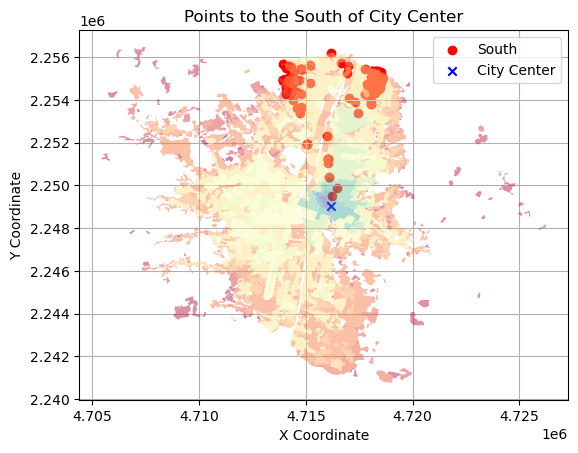

In [45]:
# Filter to only include 'South' points
north_landslides = landslides[landslides['category'] == 'North']

# Plot the points to the south
plt.figure(figsize=(10, 10))
med.plot(column='year', 
         cmap='Spectral_r',
         alpha=0.5,
         zorder=2)
plt.scatter([point.x for point in north_landslides['geometry']], [point.y for point in north_landslides['geometry']], color='red', label='North')
plt.scatter(city_center_x, city_center_y, color='blue', marker='x', label='City Center')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.legend()
plt.title('Points to the North of City Center')
plt.grid(True)
plt.show()

In [32]:
unbound=gpd.read_file("Medellin_Risk_V2.gdb", driver='FileGDB', layer='Unbound_location_as_points')

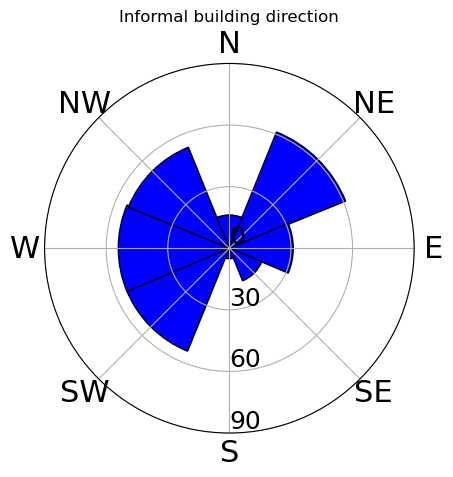

In [34]:
# Calculate directions
unbound['direction'] = unbound.apply(lambda row: calculate_direction(row, center_x=city_center_x, center_y=city_center_y), axis=1)
#print(landslides[['geometry', 'direction']]) 

unbound['category'] = unbound['direction'].apply(categorize_direction)
#print(landslides[['direction', 'category']])  # Check categorized directions

# Count occurrences
direction_counts = unbound['category'].value_counts().reindex(
    ['North', 'North-East', 'East', 'South-East', 'South', 'South-West', 'West', 'North-West'],
    fill_value=0
)

# Create the rose diagram
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
categories = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False).tolist()
angles += angles[:1]  # repeat the first value to close the circle

values = direction_counts.values.tolist()
values += values[:1]  # repeat the first value to close the circle

bars = ax.bar(angles, values, width=0.8, bottom=0.1, color='blue', edgecolor='black')

ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)
ax.set_rlabel_position(180) 
max_value = max(values)
step = max_value // 2 if max_value > 2 else 1
ax.set_yticks(np.arange(0, max_value + step, step))
ax.tick_params(axis='y', labelsize=18)
ax.tick_params(axis='x', labelsize=22)
plt.title('Informal building direction')
#plt.savefig("landslide_direction.pdf", dpi=300, bbox_inches='tight')
plt.show()

In [38]:
direction_counts

category
North         16
North-East    61
East          31
South-East    17
South          5
South-West    54
West          54
North-West    53
Name: count, dtype: int64

<Figure size 1000x1000 with 0 Axes>

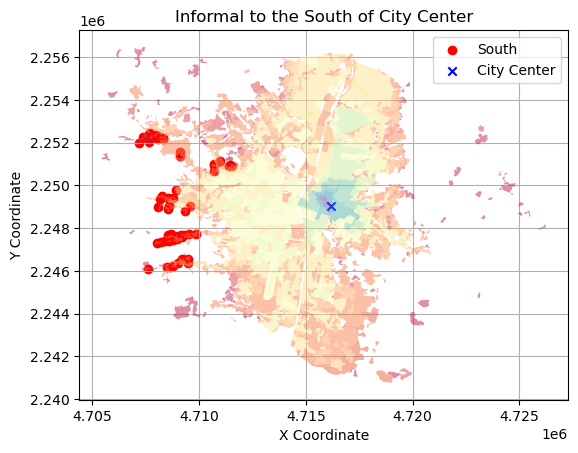

In [37]:
# Filter to only include 'South' points
south_unbound = unbound[unbound['category'] == 'West']

# Plot the points to the south
plt.figure(figsize=(10, 10))
med.plot(column='year', 
         cmap='Spectral_r',
         alpha=0.5,
         zorder=2)
plt.scatter([point.x for point in south_unbound['geometry']], [point.y for point in south_unbound['geometry']], color='red', label='South')
plt.scatter(city_center_x, city_center_y, color='blue', marker='x', label='City Center')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.legend()
plt.title('Informal to the South of City Center')
plt.grid(True)
plt.show()